# Дипломная работа

Ноутбук с описанием задания находится [по ссылке](https://colab.research.google.com/drive/16rXN02vw7WP8vQx-1z-yEOgOezzOt1yd#scrollTo=3cTfAkxD1Nov).

## Импорт библиотек

In [1]:
# Данные
import pandas as pd
import numpy as np

# Статистика
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import mannwhitneyu

# Визуализация
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg
from matplotlib.transforms import Bbox
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from PIL import Image
palette = plt.get_cmap('Set2')
plt.style.use('seaborn-darkgrid')

# Прочие радости жизни
from itertools import combinations
import re

## Знакомство с данными и предварительная  их обработка

In [3]:
# Загружаем и смотрим данные

df = pd.read_csv('megafon.csv')

print(f'Количество строк: {df.shape[0]}')
df.head()

Количество строк: 3112


,user_id,Q1,Q2,Total Traffic(MB),Downlink Throughput(Kbps),Uplink Throughput(Kbps),Downlink TCP Retransmission Rate(%),Video Streaming Download Throughput(Kbps),Video Streaming xKB Start Delay(ms),Web Page Download Throughput(Kbps),Web Average TCP RTT(ms)
0,1,5,NaN,775.48846,360.13,86.56,3.93,1859.15,2309,1007.82,83
1,2,5,4,861.96324,3023.54,411.18,1.27,667.47,2080,255.36,425
2,3,1,4,261.11860,790.96,34.20,1.79,1079.60,6367,535.85,485
3,4,8,3,179.18564,2590.97,325.88,0.80,7053.81,3218,1221.02,51
4,5,2,"2, 3, 4",351.99208,731.61,223.54,1.15,4550.38,1767,2336.56,68


In [4]:
# Сводная информация по данным

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3112 entries, 0 to 3111
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   user_id                                    3112 non-null   int64  
 1   Q1                                         3110 non-null   object 
 2   Q2                                         1315 non-null   object 
 3   Total Traffic(MB)                          3112 non-null   float64
 4   Downlink Throughput(Kbps)                  3112 non-null   float64
 5   Uplink Throughput(Kbps)                    3112 non-null   float64
 6   Downlink TCP Retransmission Rate(%)        3112 non-null   float64
 7   Video Streaming Download Throughput(Kbps)  3112 non-null   float64
 8   Video Streaming xKB Start Delay(ms)        3112 non-null   int64  
 9   Web Page Download Throughput(Kbps)         3112 non-null   float64
 10  Web Average TCP RTT(ms) 

Есть пропущенные значения в столбцах 'Q1' и 'Q2'. Попробуем разобраться в ситуации.

In [5]:
df['Q1'].unique()

array(['5', '1', '8', '2', '3', '9', '10', '7', '4', '11', '6', '2, 9',
       '0', '1, 3', '19', '15', nan, '1, 6', '***** ** ***',
       '3 - дер.Ширяево Волоколамского района, 9 - в Москве', '10, 9',
       'Чем даль ше,тем лучше.Спасибо за ваш труд.Оценка 10 !',
       'ОЦЕНКА-3/НЕВАЖНО/', 'Отвратительно',
       'Я ценой услуг не удовлетворен', 'Пока не понял', '3, 9', '5, 6',
       '0, 1, 5', '5, 7', 'Hi',
       '4. Тульская область Заокский район. Романовские дачи связи почти нет',
       'Немагу дать атценку денги незашто снимаеть скоро выклучаю',
       '10, 50',
       'Очень  хорошо. Обслуживания  я довольно. Спасибо вам.555', '?',
       'Поохое',
       'Когда в Москве-10 а когда в калужской области в деревне Бели-1',
       'Нет', 'Да', 'Ужасно',
       '3 тройка, связь отвратительная, жалко платить за такой тарив',
       'Чдтчдтччдтччч', '3, 7', '20, 89031081392', '1, 8', 'Без з',
       '10, 5', '2, 5',
       'Я в Смол. Области живу сейчас, не пользуюсь телефоном с

Среди ответов помимо пропущенных есть также некорректные с точки зрения постановки вопроса. Сделаем в таком случае частотный анализ по ответам и будем надеяться, что плохих ответов не слишком много.

In [6]:
df['Q1'].value_counts()

10                                                                      846
1                                                                       532
3                                                                       325
8                                                                       291
9                                                                       238
5                                                                       234
7                                                                       200
2                                                                       168
4                                                                       123
6                                                                       101
0                                                                        10
5, 6                                                                      2
Да                                                                        2
1, 3        

Так и есть. Поэтому есть большой соблазн такие ответы проигнорировать, но мы не зря проходили курсы по питону. Попробуем достать числа из таких ответов. Определим правила игры:

* В случае наличия нескольких чисел в одном ответе предлагаю такой ответ не учитывать и относить к категории пользователей, проигнорировавших опрос (пока там два NaN значения).
* Если ответ выходит за пределы отрезка [1, 10], принимаем за ответ либо 1 либо 10.

In [7]:
def Q1_fixer(x: str) -> str:
    
    '''Вычленяем числовой ответ из строки и заодно маркируем неудовлетворительные ответы'''
    
    if not pd.isna(x):
        tmp = re.compile(r'\d+').findall(x)
        
        if len(tmp) != 1:
            return 'NaN'
        if int(tmp[0]) < 1:
            return '1'
        elif int(tmp[0]) < 10:
            return tmp[0]
        return '10'
    
    return 'NaN'

In [8]:
df['Q1_fixed'] = df['Q1'].apply(Q1_fixer)

df['Q1_fixed'].value_counts()

10     851
1      542
3      327
8      291
9      238
5      234
7      200
2      168
4      124
6      101
NaN     36
Name: Q1_fixed, dtype: int64

Вроде бы получилось! Получили всего 36 пропущенных значений из 3112. Могло быть хуже. Также можно отметить явное превосходство 'радикалов' среди опрошенных: самые популярные ответы это либо 10 либо 1.
Посмотрим теперь как обстоят дела с ответом на второй вопрос.

In [9]:
df['Q2'].unique()

array([nan, '4', '3', '2, 3, 4', '4, 5', '1, 3, 4', '1, 3, 4, 5', '1, 3',
       '3, 4', '1, 2', '3, 5', '1', '7', '1, 4', '1, 2, 3, 4, 5', '2, 3',
       '1, 2, 3, 4', '2, 3, 4, 5', '3, 4, 5', '1, 2, 5', '1, 5',
       '1, 2, 4', '6', '1, 4, 5', '1, 2, 3', '2, 5', '2, 4, 5', '1, 2, 7',
       '5', '2', '1, 2, 3, 4, 5, 6', '0, 1, 7', '4, 7', '1, 4, 7', '0, 3',
       '1, 3, 4, 5, 7', '3, 7', '1, 3, 4, 7', '3, 4, 5, 7', '2, 4',
       '5, 6', '1, 2, 3, 5', '1, 3, 5', '1, 2, 34', '1, 2, 4, 5',
       '0, 05, 2, 27, 7', '1, 3, 7', '3, 4, 7', '1, 2, 3, 4, 7', '10',
       '0', '1, 2, 3, 7'], dtype=object)

Здесь все почти хорошо. Выкинем все, что не из отрезка [1, 7], все сомнения трактуем в пользу опрошенных (например, '34' считаем как '3' и '4'). Пропуски соберем в отдельную категорию.

In [10]:
def Q2_fixer(x: str) -> (list, str):
    
    '''Получаем вместо строки список и маркируем неудовлетворительные ответы'''
    
    if not pd.isna(x):
        tmp = np.array([elem for elem in re.compile(r'\d').findall(x) if elem in np.arange(1, 8).astype(str)])
        return np.unique(tmp).tolist()
          
    return 'NaN'

In [11]:
df['Q2_fixed'] = df['Q2'].apply(Q2_fixer)

df.explode('Q2_fixed')['Q2_fixed'].value_counts()

NaN    1797
3       706
1       648
4       626
5       222
2       184
7        86
6        13
Name: Q2_fixed, dtype: int64

И здесь получилось! Интересно, что со значительным отрывом лидуруют причины 3, 1, 4. То есть в основном абоненты недовольны качеством связи в зданиях, прерывистой связью и медленным интернетом - результаты прямо-таки удивительные (нет).

## Анализ количественных признаков

Для удобства соберем отдельно признаки, которые будем анализировать. А анализировать мы будем следующие столбцы (скопировано из ноутбука с описанием задания, но мне не стыдно):

&nbsp;&nbsp;&nbsp;&nbsp; `Total Traffic(MB)` — объем трафика передачи данных <sup>1 </sup>; <br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink Throughput(Kbps)` — средняя скорость «к абоненту» <sup>2 </sup>;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Uplink Throughput(Kbps)`— средняя скорость «от абонента» <sup>3 </sup>;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink TCP Retransmission Rate(%)` — частота переотправок пакетов «к абоненту» <sup>4 </sup>;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming Download Throughput(Kbps)` — скорость загрузки потокового видео <sup>5 </sup>;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming xKB Start Delay(ms)` — задержка старта воспроизведения видео <sup>6 </sup>;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Page Download Throughput(Kbps)` — скорость загрузки web-страниц через браузер <sup>7 </sup>;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Average TCP RTT(ms)` — пинг при просмотре web-страниц<sup>8 </sup>.<br>


<sup>1 </sup> — Насколько активно абонент использует мобильный интернет.<br>
<sup>2 </sup> — Считается по всему трафику передачи данных.<br>
<sup>3 </sup> — Считается по всему трафику передачи данных.<br>
<sup>4 </sup> — Чем выше, тем хуже. Если в канале возникает ошибка, пакет переотправляется. Снижается полезная скорость.<br>
<sup>5 </sup> — Чем выше, тем лучше — меньше прерываний и лучше качество картинки.<br>
<sup>6 </sup> — Сколько времени пройдёт между нажатием на кнопку Play и началом воспроизведения видео. Чем меньше это время, тем быстрее начинается воспроизведение.<br>
<sup>7 </sup> — Чем выше, тем лучше.<br>
<sup>8 </sup> — Чем меньше, тем лучше — быстрее загружаются web-страницы.<br>

Первый технический показатель представлен как сумма за период в одну неделю перед участием в опросе. Остальные технические показатели отображают среднее значение по данному признаку за период в одну неделю перед участием в опросе.

In [12]:
cols = list(
    set(df.columns) - set(['user_id', 'Q1', 'Q1_fixed', 'Q2', 'Q2_fixed', ])
)

cols = sorted(cols, key=lambda x: df.columns.to_list().index(x))

Начинаем с основных статистик.

In [13]:
df[cols].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Total Traffic(MB),3112.0,406.282339,220.593815,100.02668,214.261193,363.99972,572.524325,887.07827
Downlink Throughput(Kbps),3112.0,2220.774023,2629.824405,13.26000,652.297500,1404.23000,2823.645000,39817.64000
Uplink Throughput(Kbps),3112.0,170.702381,204.031286,6.11000,70.735000,119.43500,210.617500,4141.85000
Downlink TCP Retransmission Rate(%),3112.0,1.834518,2.074593,0.05000,0.720000,1.30000,2.240000,31.20000
Video Streaming Download Throughput(Kbps),3112.0,5728.806848,5161.475235,0.00000,2324.550000,4436.50000,7611.440000,58566.03000
Video Streaming xKB Start Delay(ms),3112.0,2107.596080,1582.423057,239.00000,1280.000000,1672.00000,2312.000000,21392.00000
Web Page Download Throughput(Kbps),3112.0,2100.258901,2062.509549,0.00000,1018.002500,1670.69500,2519.987500,35603.97000
Web Average TCP RTT(ms),3112.0,194.195051,267.387914,0.00000,74.000000,118.00000,207.000000,3471.00000


Большая разница между максимальными и минимальными значениями почти для всех признаков (кроме суммарного объема трафика), а также разница между средними и медианными значениями (опять-таки кроме суммарнного объема трафика) свидетельствует о большом разбросе в данных и возможном наличии выбросов.Посмотрим на распределения признаков.

In [14]:
paper = go.Figure()
palette = px.colors.sequential.Viridis_r

start_col = cols[0]
colors = iter([palette[i] if i < len(palette) else palette[i % len(palette)] for i in range(len(cols))])
for col in cols:
    
    visible = False if col != start_col else True
    
    paper.add_trace(go.Histogram(x=df[col],
                                 opacity=0.9,
                                 marker_color=next(colors),
                                 marker_line_color='white',
                                 marker_line_width=.8,
                                 visible=visible,
                                 name=col))

n = len(paper.data)
mysteps = [None] * n
for i in range(n):  
    tmp = [True if i == j else False for j in range(n)]
    step = dict(method="update", args=[{'visible': tmp}, {'title.text': paper.data[i].name}], label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': cols[0]}, title_x=0.5)

paper.show()

In [14]:
# Сохраняем картинку
 
frames = [Image.open(f'newplot\newplot{frame_number}.png') for frame_number in range(1, n + 1)]

frames[0].save(
    'disributions.gif',
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=2000,
    loop=0
)

OSError: [Errno 22] Invalid argument: 'newplot\newplot1.png'

Судя по всему объем трафика - это единственный признак, где нет аномально больших значений. Было бы неплохо оценить количество выбросов в каждом признаке.
Хорошо, что умные люди до нас придумали замечательную штуку box-plot и нам не надо придумывать условие, по которому можно определить выбросы в данных.

In [15]:
def outliers(ser: pd.Series) -> (int, float, float):
    
    '''
    Возвращаем количество выбросов в серии, процент выбросов и граничное значение. Проверяем серию только на аномально
    большие значения.
    
    '''
    
    limit = ser.quantile(q=0.75) + 1.5 * (ser.quantile(q=0.75) - ser.quantile(q=0.25))
    
    return (ser > limit).sum(), (ser > limit).sum() * 100 / ser.size, limit

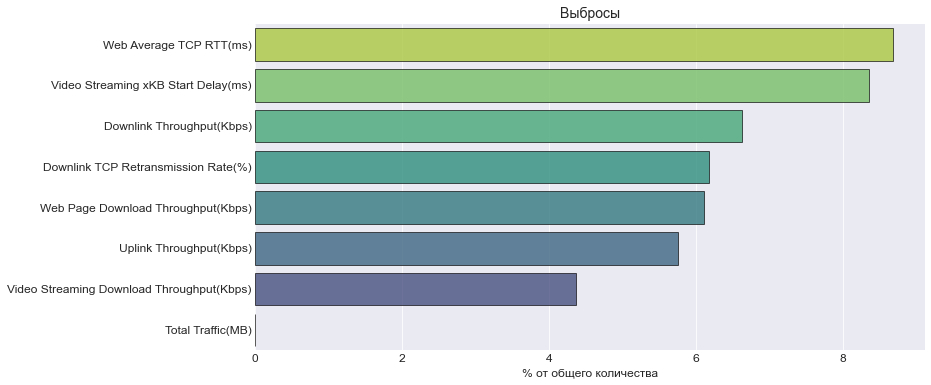

In [16]:
# Сразу визуализирум то, что насчитали (и заодно сохраняем в картинку)

fig, ax = plt.subplots(figsize=(12, 6))
sns.despine(left=False, bottom=False, right=True)

tmp = pd.Series(data={col: outliers(df[col])[1] for col in cols}).sort_values(ascending=False)
sns.barplot(x=tmp.values,
            y=tmp.index,
            order=tmp.index,
            alpha=0.8,
            palette='viridis_r',
            edgecolor='black',
            linewidth=.8,
            ax=ax)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('% от общего количества', fontsize=12)
plt.ylabel(None)
plt.title('Выбросы', fontsize=14)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0,0), min(tightbox.y0,0), max(tightbox.x1,w), max(tightbox.y1,h))
plt.savefig('outliers.png', bbox_inches=bbox)

plt.show()


Самое большое количестов выбросов (чуть более 8% от всех значений) в столбцах про пинг и задержку старта воспроизведения
видео. В остальных столбцах аномалий меньше. В общем трафике их нет вообще (как было отмечено ранее). Запомним этот факт на будущее - может пригодиться для статистических тестов (а может и нет).
Сохраним названия столбцов с выбросами отдельно.

In [17]:
out_cols = tmp[tmp > 0].index.tolist()

out_cols = sorted(out_cols, key=lambda x: df.columns.to_list().index(x))

Можно также проверить распределения признаков на нормальность с помощью QQ-plot. Выбросы учитавать не будем - не зря мы научились их определять, да и нормальности к распределениям они точно не добавят.

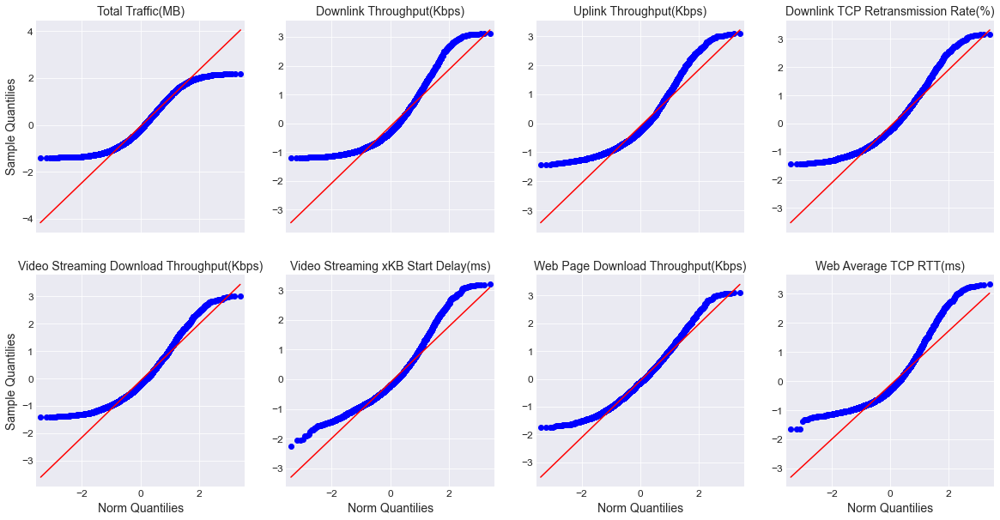

In [18]:
fig, axs = plt.subplots(figsize=(20, 10), nrows=2, ncols=len(cols) // 2, sharex=True)

for col, ax in zip(cols, axs.ravel()):
    data = df[df[col] <= outliers(df[col])[2]][col]
    qqplot(data=data, fit=True, line='q', ax=ax)
    
    ax.set_title(col, fontsize=14)
    
    ax.set_ylabel('Sample Quantilies' if col in (cols[0], cols[len(cols) // 2]) else None, fontsize=14)
    ax.set_xlabel('Norm Quantilies' if col in cols[len(cols) // 2:] else None, fontsize=14)
    
    ax.xaxis.set_tick_params(labelsize=12)
    ax.yaxis.set_tick_params(labelsize=12)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('QQ_plots.png', bbox_inches=bbox)    
    
plt.show()

Как видно (и как можно было догадаться), распределения далеки от нормальных. В основном подводят левые хвосты (да и правые хвосты распределений ведут себя не очень).
Давайте теперь посмотрим на взаимную корреляцию между признаками.

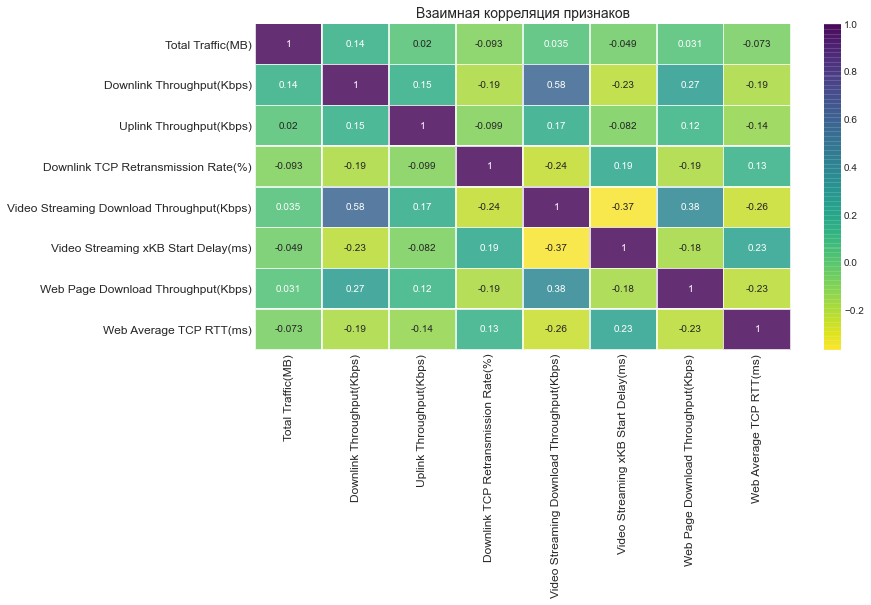

In [19]:
fig, _ = plt.subplots(figsize=(12, 6))

sns.heatmap(df[cols].corr(), annot=True, cmap='viridis_r', linewidths=.4, alpha=0.8)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Взаимная корреляция признаков', fontsize=14)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('Heatmap.png', bbox_inches=bbox)  

plt.show()

Сильной взаимосвязи не обнаружено. Что-то похоже на среднюю взаимосвязь мождо наблюдать между скоростью загрузки видео и скоростью загрузки данных к абоненту. Эту связь в принципе можно объяснить логически. Давайте визуально убедимся в расчетах (выбросы опустим).

In [20]:
paper = go.Figure()
palette = px.colors.sequential.Viridis_r

col_combs = list(map(list, combinations(cols, 2)))
start_comb = col_combs[0]
colors = iter([palette[i] if i < len(palette) else palette[i % len(palette)] for i in range(len(col_combs))])
for col in col_combs:
    
    visible = False if col != start_comb else True
    data = df[(df[col[0]] <= outliers(df[col[0]])[2]) & (df[col[1]] <= outliers(df[col[1]])[2])]   
    paper.add_trace(go.Scatter(x=data[col[0]],
                               y=data[col[1]],
                               opacity=0.9,
                               mode='markers',
                               marker_color=next(colors),
                               marker_line_color='white',
                               marker_line_width=.8,
                               visible=visible,
                               name=f'{col[1]} & {col[0]}'))

n = len(paper.data)
mysteps = [None] * n
for i in range(n):
    
    tmp = [True if i == j else False for j in range(n)] 
    step = dict(method="update",
                args=[
                    {'visible': tmp},
                    {'title.text': paper.data[i].name,
                     'xaxis.title': col_combs[i][0],
                     'yaxis.title': col_combs[i][1]}
                ],
                label=f'{i + 1}'
               )
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)],
                    title={'text': f'{start_comb[1]} & {start_comb[0]}'},
                    title_x=0.5,
                    xaxis_title=start_comb[0],
                    yaxis_title=start_comb[1]
                   )

paper.show()

In [27]:
# Сохраняем картинку
 
frames = [Image.open(f'very_new_plot\very_newplot{frame_number}.png') for frame_number in range(1, n + 1)]

frames[0].save(
    'scatters.gif',
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=1800,
    loop=0
)

Как и можно было ожидать, линейной корреляции между признаками необнаружено даже при отсутствии выбросов.

## Анализ ответов на первый вопрос

Попробуем теперь разобраться с первым вопросом. Вспомним наши ответы (обойдемся без пропущенных значений)

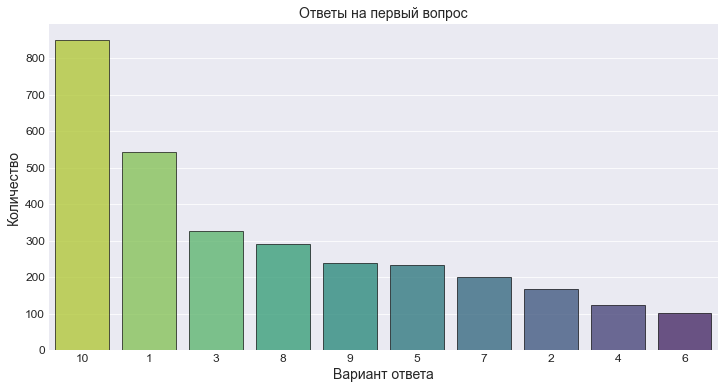

In [21]:
fig, _ = plt.subplots(figsize=(12, 6))
sns.despine(left=False, bottom=False, right=True)

Q1_answers = df[df['Q1_fixed'] != 'NaN']['Q1_fixed'].value_counts()

sns.barplot(x=Q1_answers.index,
            y=Q1_answers.values,
            order=Q1_answers.index,
            palette='viridis_r',
            alpha=0.8,
            edgecolor='black',
            linewidth=.8)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Вариант ответа', fontsize=14)
plt.ylabel('Количество', fontsize=14)
plt.title('Ответы на первый вопрос', fontsize=14)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('Q1_answers.png', bbox_inches=bbox)  

plt.show()

Явное преобладание ответов 10 и 1 можно легко объяснить с помощью здравого смысла и наличия жизненного опыта: никто из
ныне живущих не будет вдохновлен идей мало того читать какие-то смс-сообщения (в век телеграма, WhatsApp и инсты (*)), да
еще и писать ответные с какими-то циферками. Дабы избавиться быстрее от этого бремени среднестатистический пользователь
будет склонен к более простым ответам. Действительно, поставить 10 намного проще, чем, например, 8 - не возникают
сомнения по поводу правильности оценки (типа, а почему бы и не 9 или вообще 7?). Для этого нужно придумать какие-нибудь
 критерии - а кому оно нужно? Быстрее ставим 10, если все более-менее устраивает, и 1, если какие-то проблемы приносят
неудобства - и дальше занимаемся своими делами.

(*) Но все-таки я все еще верю в человечество !

### Первая гипотеза

#### 1. Постановка задачи

Был проведен опрос, в результате которого пользователи должны были оценить качество связи. Формулируем вопрос: есть ли взаимосвязь между поставленной оценкой и значениями технических показателей, которыми мы располагаем. Если взаимосвязь обнаружить не получится, то в будущем компании придется пересмотреть политику проведения смс-опросов.

#### 2. Блок с EDA

Для проверки гипотезы надо взять пользователей с различными оценками. Я предлагаю рассмотреть две группы: те, кто поставили оценку 10, и те, кто поставил 1. Если разница в технических показателях есть, то она точно есть в группах с диаметрально противоположными оценками.
Попробуем найти соответствующий 'сигнал' в данных с помощью визуализации. В качестве визуализации выберем box-plot для каждой группы по каждому показателю. В первую очередь смотрим на медианы (в отличие от средних менее чувствительны к выбросам), также можем оценить и разницу в разбросе значений по группам. 

In [22]:
# Сохраняем отдельный датафрейм с нашими группами абонентов

df_10_1 = df[df['Q1_fixed'].isin(('10', '1'))]

In [23]:
paper = go.Figure()
palette_1 = px.colors.sequential.Reds_r[:5]
palette_2 = px.colors.sequential.Blues_r[:5]


start_col = cols[0]
colors_1 = iter([palette_1[i] if i < len(palette_1) else palette_1[i % len(palette_1)] for i in range(len(cols))])
colors_2 = iter([palette_2[i] if i < len(palette_2) else palette_2[i % len(palette_2)] for i in range(len(cols))])

for col in cols:
    
    visible = False if col != start_col else True

    paper.add_trace(go.Box(x=df_10_1[df_10_1['Q1_fixed'] == '10'][col],
                           marker_color=next(colors_1),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='10'))
    
    paper.add_trace(go.Box(x=df_10_1[df_10_1['Q1_fixed'] == '1'][col],
                           marker_color=next(colors_2),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='1'))
    
n = len(cols)
mysteps = [None] * n
for i, col in enumerate(cols):
    tmp = [True if j in (2 * i, 2 * i + 1) else False for j in range(len(paper.data))] 
    step = dict(method="update", args=[{'visible': tmp}, {'title.text': col}], label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': cols[0]}, title_x=0.5)

paper.show()

In [24]:
paper = go.Figure()
palette_1 = px.colors.sequential.Peach[1:]
palette_2 = px.colors.sequential.Aggrnyl[1:]


start_col = cols[0]
colors_1 = iter([palette_1[i] if i < len(palette_1) else palette_1[i % len(palette_1)] for i in range(len(cols))])
colors_2 = iter([palette_2[i] if i < len(palette_2) else palette_2[i % len(palette_2)] for i in range(len(cols))])

for col in cols:
    
    visible = False if col != start_col else True
    
    data = df_10_1.groupby('Q1_fixed')[col].agg(['mean', 'median']).stack().reset_index()
    
    paper.add_trace(go.Bar(x=data[data['Q1_fixed'] == '10'][0],
                           y=data[data['Q1_fixed'] == '10']['level_1'],
                           base='group',
                           orientation='h',
                           marker_color=next(colors_1),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='10'))
    
    paper.add_trace(go.Bar(x=data[data['Q1_fixed'] == '1'][0],
                           y=data[data['Q1_fixed'] == '1']['level_1'],
                           base='group',
                           orientation='h',
                           marker_color=next(colors_2),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='1'))

n = len(cols)
mysteps = [None] * n
for i, col in enumerate(cols):
    tmp = [True if j in (2 * i, 2 * i + 1) else False for j in range(len(paper.data))] 
    step = dict(method="update", args=[{'visible': tmp}, {'title.text': col, 'barmode': 'group'}], label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': cols[0]}, title_x=0.5)

paper.show()

In [69]:
# Сохраняем картинку
 
frames = [Image.open(f'medians\medians{frame_number}.png') for frame_number in range(1, n + 1)]

frames[0].save(
    'medians.gif',
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=2000,
    loop=0
)

Результаты EDA:

&nbsp;&nbsp;&nbsp;&nbsp; `Total Traffic(MB)` — видимой разницы между медианами нет, интерквартильный размах почти не отличается; <br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink Throughput(Kbps)` — медиана больше в группе 10;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Uplink Throughput(Kbps)`— (после визуального увеличения) медиана больше в группе 10;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink TCP Retransmission Rate(%)` — медиана больше в группе 1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming Download Throughput(Kbps)` — медиана больше в группе 10;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming xKB Start Delay(ms)` — медиана больше в группе 1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Page Download Throughput(Kbps)` — медиана больше в группе 10;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Average TCP RTT(ms)` — медиана больше в группе 1.<br>

Разница есть во всех показателях кроме суммарного трафика. Теперь нужно проверить значима ли она статистически.

#### 3. Блок со статистическим тестом

Мы хотим проверить есть ли разница в средних у двух выборок. На основе визуализаций распределений признаков по группам можно сделать вывод, что дисперсии по группам конечно не равны, но хотя бы не сильно различаются (это хорошо), но вот ранее мы выясняли, что данные не распределены нормально (это плохо), да и аномально больших значений хватает (тоже плохо). Поэтому проверку нашей гипотезы предлагаю осуществить с помощью U-критерия Манна - Уитни (непараметрический аналог t-критерия Стъюдента). Пороговый уровень значимости предлагаю принять 5%. Проверяем двустороннюю альтернативную гипотезу.

In [24]:
def mann_test(data: pd.DataFrame, features: list, split_feature: str='Q1_fixed', p_value: float=0.05) -> pd.DataFrame:
    
    '''
    Тест Манна-Уитни: подаем на вход данные, список признаков, признак, по которому отделяются две различные группы
    и уровень значимости. Возвращаем результаты в виде датафрейма
    
    '''
    
    if data[split_feature].nunique() != 2:
        raise ValueError('Сравниваем две группы наблюдений!')
        
    names = data.groupby(split_feature)[split_feature].count()   
    tmp = {col: None for col in cols}
    for col in features:
        x = data[data[split_feature].eq(names.index[0])][col]
        y = data[data[split_feature].eq(names.index[1])][col]
        tmp[col] = mannwhitneyu(x, y)
    
    print(f'Количество наблюдений в группе {names.index[0]}: {names.values[0]}')
    print(f'Количество наблюдений в группе {names.index[1]}: {names.values[1]}')
    
    return pd.DataFrame(data={
                   'U-statistic': [tmp[col][0] for col in features],
                   'p_value': [tmp[col][1] for col in features],
                  f'p_value < {p_value}': [tmp[col][1] < p_value for col in features]
                  },
             index=cols)

In [25]:
mann_test(df_10_1, cols)

Количество наблюдений в группе 1: 542
Количество наблюдений в группе 10: 851


,U-statistic,p_value,p_value < 0.05
Total Traffic(MB),228647.0,3.937311e-01,False
Downlink Throughput(Kbps),192875.0,1.257646e-07,True
Uplink Throughput(Kbps),200948.0,2.520958e-05,True
Downlink TCP Retransmission Rate(%),200347.5,1.768998e-05,True
Video Streaming Download Throughput(Kbps),183128.0,4.345284e-11,True
Video Streaming xKB Start Delay(ms),181652.5,1.118051e-11,True
Web Page Download Throughput(Kbps),179260.5,1.137567e-12,True
Web Average TCP RTT(ms),184225.5,1.161541e-10,True


Получили статистически значимые (на уровне значимости 5%) различия в средних значениях по всем признакам кроме суммарного трафика, то есть подтвердили визуальные различия. Давайте попробуем визуализировать данную картину.

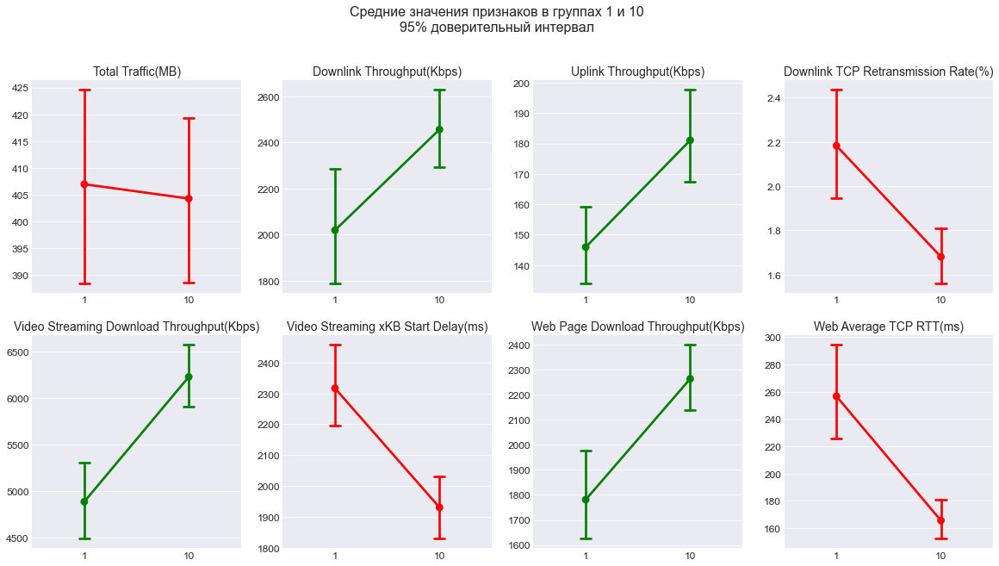

In [26]:
fig, axs = plt.subplots(figsize=(20, 10), nrows=2, ncols=int(np.ceil(len(cols) / 2)))

for col, ax in zip(cols, axs.ravel()):
    
    names = df_10_1.groupby('Q1_fixed')['Q1_fixed'].count()
    a = df_10_1[df_10_1['Q1_fixed'] == names.index[0]][col].mean()
    b = df_10_1[df_10_1['Q1_fixed'] == names.index[1]][col].mean()
    
    sns.pointplot(data=df_10_1,
                  x='Q1_fixed',
                  y=col,
                  color='red' if a > b else 'green',
                  n_boot=1358,
                  ci=95,
                  seed=17,
                  capsize=.1,
                  ax=ax)
    
    ax.set_title(col, fontsize=14)
    
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    
    ax.xaxis.set_tick_params(labelsize=12)
    ax.yaxis.set_tick_params(labelsize=12)
     
plt.suptitle('Средние значения признаков в группах 1 и 10\n95% доверительный интервал', fontsize=16, y=1.0)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('medians_with_conf.png', bbox_inches=bbox)

plt.show() 

#### 4. Вывод

Мы хотели проверить наличие взаимосвязи между техническими показателями и оценками, которые ставят пользователи. В результате статистического теста эту взаимосвязь удалось подтвердить. Получили, что пользователи, которые поставили оценку 1 имеют  технические показатели в среднем хуже по сравнению с теми, кто поставил 10. Не удалось выявить разницу только в объеме трафика, что говорит о том, что интернетом все пользуются в одинаковом объеме. Поэтому можно сделать вывод, что приведенные технические показатели оказывают влияние на удовлетворенность качеством услуг.

### Первая гипотеза***

#### 1. Постановка задачи

Точно такая же как и в первой гипотезе.

#### 2. Блок с EDA

Все также как и в первой гипотезе, только проверяем пользователей с оценками 2-9, предварительно разбив их на группы. 

In [27]:
# Примерно так

Q1_answers.loc['2'] + Q1_answers.loc['3']+ Q1_answers.loc['4']  + Q1_answers.loc['5'],\
Q1_answers.loc['8'] + Q1_answers.loc['9']  + Q1_answers.loc['7'] + Q1_answers.loc['6']

(853, 830)

In [28]:
# Создаем отдельный датасет

df_2_9 = df[df['Q1_fixed'].isin(np.arange(2, 10).astype(str))].copy()

df_2_9['Q1_fixed'] = df_2_9['Q1_fixed'].apply(lambda x: '2-5' if x in np.arange(2, 6).astype(str) else '6-9')

In [29]:
paper = go.Figure()
palette_1 = px.colors.sequential.Reds_r[:5]
palette_2 = px.colors.sequential.Blues_r[:5]


start_col = cols[0]
colors_1 = iter([palette_1[i] if i < len(palette_1) else palette_1[i % len(palette_1)] for i in range(len(cols))])
colors_2 = iter([palette_2[i] if i < len(palette_2) else palette_2[i % len(palette_2)] for i in range(len(cols))])

for col in cols:
    
    visible = False if col != start_col else True

    paper.add_trace(go.Box(x=df_2_9[df_2_9['Q1_fixed'] == '2-5'][col],
                           marker_color=next(colors_1),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='2-5'))
    
    paper.add_trace(go.Box(x=df_2_9[df_2_9['Q1_fixed'] == '6-9'][col],
                           marker_color=next(colors_2),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='6-9'))

mysteps = [None] * len(cols)
for i, col in enumerate(cols):
    tmp = [True if j in (2 * i, 2 * i + 1) else False for j in range(len(paper.data))] 
    step = dict(method="update", args=[{'visible': tmp}, {'title.text': col}], label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': cols[0]}, title_x=0.5)

paper.show()

Результаты EDA:

&nbsp;&nbsp;&nbsp;&nbsp; `Total Traffic(MB)` — медиана больше в группе 2-5; <br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink Throughput(Kbps)` — медиана больше в группе 6-9;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Uplink Throughput(Kbps)`— (после визуального увеличения) медиана больше в группе 6-9;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink TCP Retransmission Rate(%)` — медиана больше в группе 2-5;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming Download Throughput(Kbps)` — медиана больше в группе 6-9;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming xKB Start Delay(ms)` — медиана больше в группе 2-5;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Page Download Throughput(Kbps)` — медиана больше в группе 6-9;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Average TCP RTT(ms)` — медиана больше в группе 2-5.<br>

Разница есть во всех показателях кроме суммарного трафика. Теперь нужно проверить значима ли она статистически.

#### 3. Блок со статистическим тестом

Такой же тест как и в первой гипотезе (уровень значимости 5% и двусторонняя альтернативная гипотеза).

In [30]:
mann_test(df_2_9, cols)

Количество наблюдений в группе 2-5: 853
Количество наблюдений в группе 6-9: 830


,U-statistic,p_value,p_value < 0.05
Total Traffic(MB),349145.0,3.132984e-01,False
Downlink Throughput(Kbps),302260.0,1.050195e-07,True
Uplink Throughput(Kbps),338012.5,5.442511e-02,False
Downlink TCP Retransmission Rate(%),321630.0,5.831986e-04,True
Video Streaming Download Throughput(Kbps),298476.5,1.275138e-08,True
Video Streaming xKB Start Delay(ms),308990.5,3.165905e-06,True
Web Page Download Throughput(Kbps),308764.0,2.843325e-06,True
Web Average TCP RTT(ms),315278.0,5.131973e-05,True


Получили статистически значимые (на уровне значимости 5%) различия по всем признакам кроме суммарного трафика и средней скорости от абонента.

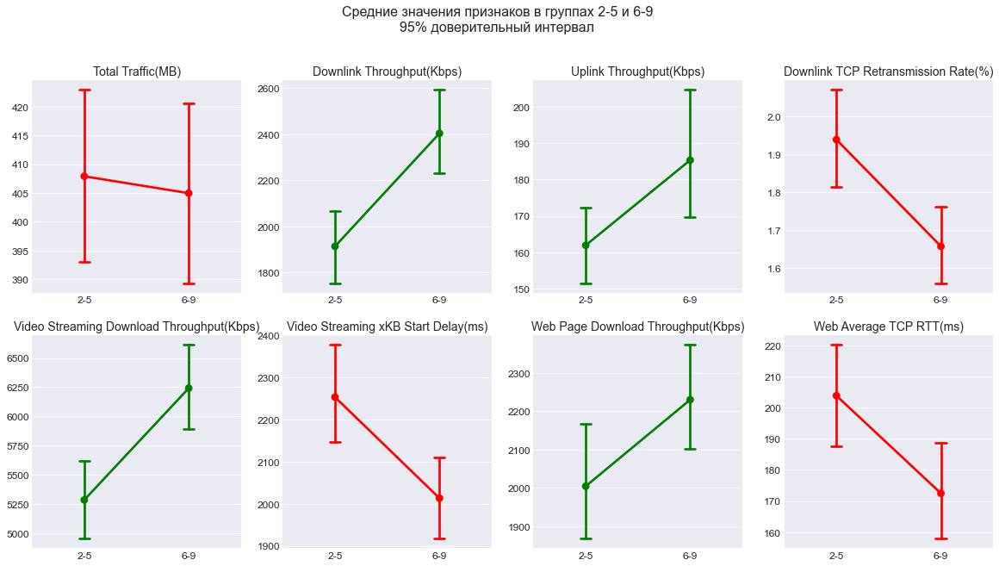

In [31]:
# Визуализируем

_, axs = plt.subplots(figsize=(20, 10), nrows=2, ncols=int(np.ceil(len(cols) / 2)))

for col, ax in zip(cols, axs.ravel()):
    
    names = df_2_9.groupby('Q1_fixed')['Q1_fixed'].count()
    a = df_2_9[df_2_9['Q1_fixed'] == names.index[0]][col].mean()
    b = df_2_9[df_2_9['Q1_fixed'] == names.index[1]][col].mean()
                
    sns.pointplot(data=df_2_9,
                  x='Q1_fixed',
                  y=col,
                  color='red' if a > b else 'green',
                  n_boot=1358,
                  ci=95,
                  seed=17,
                  capsize=.1,
                  ax=ax)
    
    ax.set_title(col, fontsize=14)
    
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    
    ax.xaxis.set_tick_params(labelsize=12)
    ax.yaxis.set_tick_params(labelsize=12)
     
plt.suptitle('Средние значения признаков в группах 2-5 и 6-9\n95% доверительный интервал', fontsize=16, y=1.0)
plt.show() 

#### 4. Вывод

Мы хотели проверить наличие взаимосвязи между техническими показателями и оценками, которые ставят пользователи (как и в первый раз). В результате статистического теста эту взаимосвязь удалось подтвердить и для пользователей с менее 'радикальными' оценками. Не удалось выявить разницу в объеме трафика и средней скорости от абонента. Во второй раз убедились, что приведенные технические показатели оказывают влияние на удовлетворенность качеством услуг.

## Анализ ответов на второй вопрос

Давайте вспомним значения ответов на второй вопрос:<br><br>
1 - недозвоны, обрывы при звонках;<br>
2 - время ожидания гудков при звонке;<br>
3 - плохое качество связи в зданиях, торговых центрах и т.п.;<br>
4 - медленный мобильный интернет;<br>
5 - медленная загрузка видео;<br>
6 - затрудняюсь ответить;<br>
7 - свой вариант.

Теперь вспомним наши ответы (обойдемся без пропущенных значений).

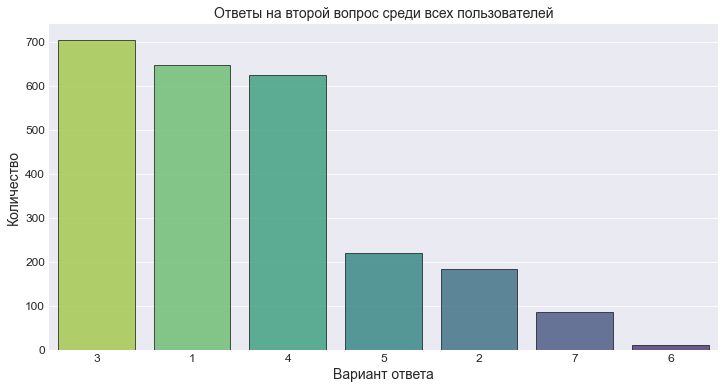

In [32]:
fig, _ = plt.subplots(figsize=(12, 6))
sns.despine(left=False, bottom=False, right=True)

Q2_answers = df[df['Q2_fixed'] != 'NaN'].explode('Q2_fixed')['Q2_fixed'].value_counts()

sns.barplot(x=Q2_answers.index,
            y=Q2_answers.values,
            order=Q2_answers.index,
            palette='viridis_r',
            alpha=0.8,
            edgecolor='black',
            linewidth=.8)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Вариант ответа', fontsize=14)
plt.ylabel('Количество', fontsize=14)
plt.title('Ответы на второй вопрос среди всех пользователей', fontsize=14)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('Q2_answers.png', bbox_inches=bbox)

plt.show()

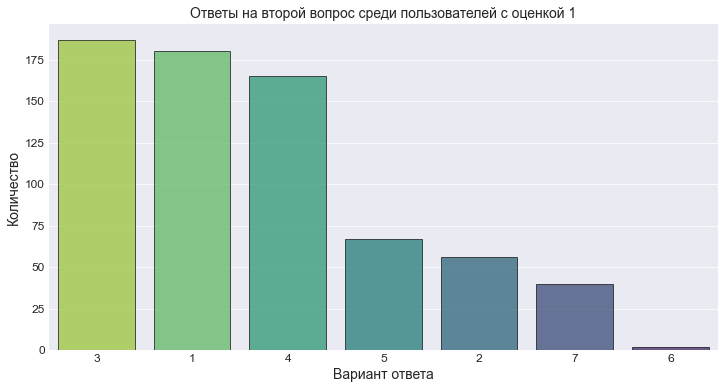

In [51]:
# Предлагаю посмотреть на ответы самых недовольных абонентов отдельно

fig, _ = plt.subplots(figsize=(12, 6))
sns.despine(left=False, bottom=False, right=True)

Q2_1_answers = df[(df['Q1_fixed'] == '1') & (df['Q2_fixed'] != 'NaN')].explode('Q2_fixed')['Q2_fixed'].value_counts()

sns.barplot(x=Q2_1_answers.index,
            y=Q2_1_answers.values,
            order=Q2_answers.index,
            palette='viridis_r',
            alpha=0.8,
            edgecolor='black',
            linewidth=.8)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Вариант ответа', fontsize=14)
plt.ylabel('Количество', fontsize=14)
plt.title('Ответы на второй вопрос среди пользователей с оценкой 1', fontsize=14)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('Q2_answers_among_1.png', bbox_inches=bbox)

plt.show()

В обоих случаях нашли лидеров. Интересно было бы посмотреть сколько раз хотя бы два из этих трех ответов встречаются вместе.

In [33]:
sets = list(map(set, combinations(('3', '1', '4'), 2)))

df[df['Q2_fixed'] != 'NaN']['Q2_fixed']\
    .apply(lambda x: bool(sets[0].issubset(set(x)) + sets[1].issubset(set(x)) + sets[2].issubset(set(x))))\
    .value_counts(normalize=True)

False    0.548289
True     0.451711
Name: Q2_fixed, dtype: float64

То есть в 45% случаев мы имеем дело хотя бы с парой ответов из множества 1, 3, 4. Также у нас есть те, кто с удовольствием в ответе указал несколько причин, и те, кто указал всего одну причину. Давайте посмотрим на соответствующие топы.

In [34]:
# Давайте найдем самый популярный ответ в случае нескольких причин (выводим топ-10)

df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: ', '.join(x) if len(x) > 1 else pd.NA).value_counts()[:10]

1, 3             121
3, 4              85
1, 3, 4           76
1, 4              56
3, 4, 5           45
1, 2, 3           44
1, 3, 4, 5        40
4, 5              30
1, 4, 5           27
1, 2, 3, 4, 5     27
Name: Q2_fixed, dtype: int64

In [35]:
# А теперь самый популярный ответ в случае одной причины

df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x[0] if len(x) == 1 else pd.NA).value_counts()[:10]

3    191
4    170
1    169
7     64
2     11
6     10
5      9
Name: Q2_fixed, dtype: int64

### Вторая гипотеза

#### 1. Постановка задачи

Итак, у нас есть разные причины неудовлетворенности клиентов, и очень часто самые топовые причины встречаются вместе в одном ответе. Хотелось бы узнать о возможной взаимосвязи между разными причинами: например, какие причины чаще встречаются самостоятельно, а какие чаще встречаются совместно с другими. Да, подтверждение подобных предположений не может гарантировать причинно-следственную связь между причинами, но эта информация может быть полезна техническому отделу при работе над устранением возможных проблем со связью. Кроме того, есть возможность скорректировать варианты ответов в будущих опросах.

#### 2. Блок с EDA

Для проверки гипотезы я предлагаю сравнивать следующие группы причин:

- 1 и 3 (недозвоны и плохая связь в помещениях);
- 1 и 2 (недозвоны и долгое ожидание гудков);
- 3 и 4 (плохая связь в помещениях и медленный интернет);
- 4 и 5 (медленный интернет и медленная скорость загрузки видео).

Сравнивать будем доли пользователей в двух группах: которые указали в ответе причины А и Б и те, которые указали причину Б, но не указали А.

In [37]:
# Выделяем группу пользователей, которая в качестве причины указала 3
# И среди них считаем количество 1

group_3_1 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if '3' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '1' if '1' in x else 'not_1')\
                                                 .value_counts()

group_3_1

not_1    362
1        344
Name: Q2_fixed, dtype: int64

In [38]:
# Выделяем группу пользователей, которая в качестве причины указала не 3
# И среди них считаем количество 1

group_not_3_but_1 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if not '3' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '1' if '1' in x else 'not_1')\
                                                 .value_counts()

group_not_3_but_1

not_1    305
1        304
Name: Q2_fixed, dtype: int64

In [39]:
# Выделяем группу пользователей, которая в качестве причины указала 1
# И среди них считаем количество 2

group_1_2 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if '1' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '2' if '2' in x else 'not_2')\
                                                 .value_counts()

group_1_2

not_2    509
2        139
Name: Q2_fixed, dtype: int64

In [40]:
# Выделяем группу пользователей, которая в качестве причины указала не 1
# И среди них считаем количество 2

group_not_1_but_2 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if not '1' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '2' if '2' in x else 'not_2')\
                                                 .value_counts()

group_not_1_but_2

not_2    622
2         45
Name: Q2_fixed, dtype: int64

In [41]:
# Выделяем группу пользователей, которая в качестве причины указала 3
# И среди них считаем количество 4

group_3_4 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if '3' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '4' if '4' in x else 'not_4')\
                                                 .value_counts()

group_3_4

not_4    388
4        318
Name: Q2_fixed, dtype: int64

In [42]:
# Выделяем группу пользователей, которая в качестве причины указала не 3
# И среди них считаем количество 4

group_not_3_but_4 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if not '3' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '4' if '4' in x else 'not_4')\
                                                 .value_counts()[::-1]

group_not_3_but_4

not_4    301
4        308
Name: Q2_fixed, dtype: int64

In [43]:
# Выделяем группу пользователей, которая в качестве причины указала 4
# И среди них считаем количество 5

group_4_5 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if '4' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '5' if '5' in x else 'not_5')\
                                                 .value_counts()

group_4_5

not_5    441
5        185
Name: Q2_fixed, dtype: int64

In [44]:
# Выделяем группу пользователей, которая в качестве причины указала не 4
# И среди них считаем количество 5

group_not_4_but_5 = df[df['Q2_fixed'] != 'NaN']['Q2_fixed'].apply(lambda x: x if not '4' in x else pd.NA)\
                                                 .dropna()\
                                                 .apply(lambda x: '5' if '5' in x else 'not_5')\
                                                 .value_counts()

group_not_4_but_5

not_5    652
5         37
Name: Q2_fixed, dtype: int64

In [46]:
names = ('3 and 1', 'not 3 and 1', '1 and 2', 'not 1 and 2',\
          '3 and 4', 'not 3 and 4', '4 and 5', 'not 4 and 5')
groups = (group_3_1, group_not_3_but_1, group_1_2, group_not_1_but_2,\
          group_3_4, group_not_3_but_4, group_4_5, group_not_4_but_5)


In [47]:
# Визуализируем

paper = go.Figure()
palette_1 = px.colors.sequential.Burgyl[1:]
palette_2 = px.colors.sequential.Darkmint[1:]


start_pair = names[:2]
colors_1 = iter([palette_1[i] if i < len(palette_1) else palette_1[i % len(palette_1)] for i in range(len(cols))])
colors_2 = iter([palette_2[i] if i < len(palette_2) else palette_2[i % len(palette_2)] for i in range(len(cols))])

for i in range(len(names) // 2):
    
    name1 = names[2 * i]
    group1 = groups[2 * i]
    name2 = names[2 * i + 1]
    group2 = groups[2 * i + 1]
    
    visible = False if name1 != start_pair[0] else True

    paper.add_trace(go.Bar(y=group1.index,
                           x=group1.values * 100 / (group1.values + group2.values),
                           orientation='h',
                           marker_color=next(colors_1),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name=name1))
    
    paper.add_trace(go.Bar(y=group2.index,
                           x=group2.values * 100 / (group1.values + group2.values),
                           orientation='h',
                           marker_color=next(colors_2),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name=name2))
n = len(names) // 2
mysteps = [None] * n
for i in range(n):
    tmp = [True if j in (2 * i, 2 * i + 1) else False for j in range(len(paper.data))] 
    step = dict(method="update",
                args=[{'visible': tmp},
                      {'title.text': f'{names[2 * i]} & {names[2 * i + 1]}',
                       'barmode': 'group',
                       'yaxis.title': 'Ответы',
                       'xaxis.title': '% ответов'}],
                label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': ' & '.join(start_pair)},
                                                   title_x=0.5,
                                                   barmode='group',
                                                   yaxis_title='Ответы',
                                                   xaxis_title='% ответов')

paper.show()

In [78]:
# Сохраняем картинку
 
frames = [Image.open(f'reasons\reasons{frame_number}.png') for frame_number in range(1, n + 1)]

frames[0].save(
    'reasons.gif',
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=2000,
    loop=0
)

Результаты EDA:
    
Визуально разница в долях ответов для разных групп наблюдается в группах с причинами 1, 2, причинами 3, 4 и причинами 4, 5. Осталось только проверить статистическую значимость этой разницы.

#### 3. Блок со статистическим тестом

Будем проверять гипотезу о равенстве долей ответов 1, 2, 4 и 5 в соответствующих группах (примем 5% уровень значимости). Количество наблюдений в группах позволяет это сделать, также мы предполагаем, что выборки независимы. Проверять будем двустороннюю альтернативную гипотезу.

In [48]:
def prop_test(data: dict, p_value: float=0.05) -> None:
    
    '''
    Тест на равенство долей в двух выборках. Данные подаются в виде словаря:
    {название: [кол-во неудач, кол-во успехов], ...}. Выводим результат теста на экран
    
    '''
    if len(data) != 2:
        raise ValueError('Проверяем две выборки!')
        
    prep = {name: (group.iloc[1], group.sum()) for name, group in data.items()}
    test = proportions_ztest([prep[name][0] for name in prep.keys()], [prep[name][1] for name in prep.keys()])
    
    for name in prep.keys():
        print(f'{name}: p = {prep[name][0] / prep[name][1]:.1%} (size: {prep[name][1]})')
    
    print(f'\nZ-statistic: {test[0]:.2f}')
    print(f'p_value: {test[1]:.4f}')
    print(f'p_value < {p_value}: {test[1] < p_value}')
    

In [49]:
data_3_1 = {name: group for name, group in zip(names[:2], groups[:2])}

prop_test(data_3_1)

3 and 1: p = 48.7% (size: 706)
not 3 and 1: p = 49.9% (size: 609)

Z-statistic: -0.43
p_value: 0.6662
p_value < 0.05: False


In [50]:
data_1_2 = {name: group for name, group in zip(names[2:4], groups[2:4])}

prop_test(data_1_2)

1 and 2: p = 21.5% (size: 648)
not 1 and 2: p = 6.7% (size: 667)

Z-statistic: 7.68
p_value: 0.0000
p_value < 0.05: True


In [51]:
data_3_4 = {name: group for name, group in zip(names[4:6], groups[4:6])}

prop_test(data_3_4)

3 and 4: p = 45.0% (size: 706)
not 3 and 4: p = 50.6% (size: 609)

Z-statistic: -2.00
p_value: 0.0452
p_value < 0.05: True


In [52]:
data_4_5 = {name: group for name, group in zip(names[6:], groups[6:])}

prop_test(data_4_5)

4 and 5: p = 29.6% (size: 626)
not 4 and 5: p = 5.4% (size: 689)

Z-statistic: 11.69
p_value: 0.0000
p_value < 0.05: True


На имеющихся данных и при уровне значимости 5% получили статистически значимые различия в группах:

- 1_2 и not_1_but_2 в долях ответов 2;
- 3_4 и not_3_but_4 в долях ответов 4.
- 4_5 и not_4_but_5 в долях ответов 5.

Не получили значимые различия в группах:

- 3_1 и not_3_but_1 в долях ответов 1.

#### 4. Вывод

Мы хотели проверить наличие взаимосвязи между различными причинами. В итоге получили, что пользователи, которые в качестве причины указали 1 (недозвоны) чаще указывают в качестве причины еще и 2 (долгое ожидание гудков) в отличие от тех, кто не указал 1 в качестве причины. Пользователи, которые указывают в качестве причины плохое качество связи в помещениях чаще указывают еще и медленный мобильный интернет. Также, пользователи, которые в качестве причины указали 4 (медленный интернет) чаще указывают в качестве причины еще и 5 (медленная скорость загрузки видео) в отличие от тех, кто не указал 4 в качестве причины. Этот вывод может намекать на наличие связи между этими причинами (нужно уточнить у специалистов).

### Третья гипотеза

#### 1. Постановка задачи

Мы знаем самые популярные причины неудовлетворенности абонентов в качестве связи. Одна из них - это медленный мобильный интернет. Также у нас есть группа клиентов, поставивишая самые низкие оценки в первом вопросе. В очередь на отказ от услуг компании эти ребята будут самими первыми. В этой группе точно такой же топ популярных причин неудовлетворенности в связи. Поскольку наши данные так или иначе связаны с интернет-соединением, напрашивается вопрос о проверки возможной разницы в показателях среди самых недовольных (с оценкой 1) и остальных, при условии, что пользователь во втором вопросе указал именно причину 4 (мобильный интернет). Те показатели, которые будут хуже в первой группе (если мы таковые найдем), являются наиболее приоритными в плане устранения проблем, так как связяны с клиентами, которые вероятнее всего настроены на прекращение пользования услугами компании.

#### 2. Блок с EDA

Разделим данные на две группы и визуализируем. В качестве визуализации выберем box-plot для каждой группы по каждому показателю. В первую очередь смотрим на медианы (в отличие от средних менее чувствительны к выбросам), также можем оценить и разницу в разбросе значений по группам. 

In [53]:
# Собираем данные

df_4 = df[df['Q2_fixed'] != 'NaN'].copy()
df_4['Q2_fixed'] = df_4['Q2_fixed'].apply(lambda x: '4' if '4' in x else pd.NA)
df_4['Q1_fixed'] = df_4['Q1_fixed'].apply(lambda x: x if x == '1' else 'not_1')
df_4 = df_4.dropna()

In [54]:
# Визуализируем

paper = go.Figure()
palette_1 = px.colors.sequential.Reds_r[:5]
palette_2 = px.colors.sequential.Blues_r[:5]


start_col = cols[0]
colors_1 = iter([palette_1[i] if i < len(palette_1) else palette_1[i % len(palette_1)] for i in range(len(cols))])
colors_2 = iter([palette_2[i] if i < len(palette_2) else palette_2[i % len(palette_2)] for i in range(len(cols))])

for col in cols:
    
    visible = False if col != start_col else True

    paper.add_trace(go.Box(x=df_4[df_4['Q1_fixed'] == '1'][col],
                           marker_color=next(colors_1),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='1'))
    
    paper.add_trace(go.Box(x=df_4[df_4['Q1_fixed'] == 'not_1'][col],
                           marker_color=next(colors_2),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='not_1'))

mysteps = [None] * len(cols)
for i, col in enumerate(cols):
    tmp = [True if j in (2 * i, 2 * i + 1) else False for j in range(len(paper.data))] 
    step = dict(method="update", args=[{'visible': tmp}, {'title.text': col}], label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': cols[0]}, title_x=0.5)

paper.show()

In [86]:
paper = go.Figure()
palette_1 = px.colors.sequential.Emrld[1:5]
palette_2 = px.colors.sequential.Plasma[1:5]


start_col = cols[0]
colors_1 = iter([palette_1[i] if i < len(palette_1) else palette_1[i % len(palette_1)] for i in range(len(cols))])
colors_2 = iter([palette_2[i] if i < len(palette_2) else palette_2[i % len(palette_2)] for i in range(len(cols))])

for col in cols:
    
    visible = False if col != start_col else True
    
    data = df_4.groupby('Q1_fixed')[col].agg(['mean', 'median']).stack().reset_index()
    
    paper.add_trace(go.Bar(x=data[data['Q1_fixed'] == '1'][0],
                           y=data[data['Q1_fixed'] == '1']['level_1'],
                           base='group',
                           orientation='h',
                           marker_color=next(colors_1),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='1'))
    
    paper.add_trace(go.Bar(x=data[data['Q1_fixed'] == 'not_1'][0],
                           y=data[data['Q1_fixed'] == 'not_1']['level_1'],
                           base='group',
                           orientation='h',
                           marker_color=next(colors_2),
                           marker_line_color='black',
                           marker_line_width=.8,
                           visible=visible,
                           name='not_1'))

n = len(cols)
mysteps = [None] * n
for i, col in enumerate(cols):
    tmp = [True if j in (2 * i, 2 * i + 1) else False for j in range(len(paper.data))] 
    step = dict(method="update", args=[{'visible': tmp}, {'title.text': col, 'barmode': 'group'}], label=f'{i + 1}')
    mysteps[i] = step

paper.update_layout(sliders=[dict(steps=mysteps)], title={'text': cols[0]}, title_x=0.5)

paper.show()

In [55]:
# Сохраняем картинку
 
frames = [Image.open(f'means\means{frame_number}.png') for frame_number in range(1, n + 1)]

frames[0].save(
    'means.gif',
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=2000,
    loop=0
)

Результаты EDA:

&nbsp;&nbsp;&nbsp;&nbsp; `Total Traffic(MB)` — медиана больше в группе not_1; <br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink Throughput(Kbps)` — медиана больше в группе not_1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Uplink Throughput(Kbps)`— медиана больше в группе not_1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Downlink TCP Retransmission Rate(%)` — (после увеличения)медиана больше в группе 1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming Download Throughput(Kbps)` — медиана больше в группе not_1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Video Streaming xKB Start Delay(ms)` — медиана больше в группе 1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Page Download Throughput(Kbps)` — медиана больше в группе not_1;<br>
&nbsp;&nbsp;&nbsp;&nbsp; `Web Average TCP RTT(ms)` — (после увеличения) медиана больше в группе 1.<br>

Разница есть во всех показателях. Теперь нужно проверить значима ли она статистически.

#### 3. Блок со статистическим тестом

Проверяем разницу средних с помощью U-критерия (как в первой гипотезе). Уроверь значимости принимаем 5%. Проверяем двустороннюю альтернативную гипотезу.

In [55]:
mann_test(df_4, cols)

Количество наблюдений в группе 1: 165
Количество наблюдений в группе not_1: 461


,U-statistic,p_value,p_value < 0.05
Total Traffic(MB),34565.0,0.041011,True
Downlink Throughput(Kbps),34002.0,0.021615,True
Uplink Throughput(Kbps),32575.5,0.003100,True
Downlink TCP Retransmission Rate(%),36109.0,0.167372,False
Video Streaming Download Throughput(Kbps),31719.0,0.000771,True
Video Streaming xKB Start Delay(ms),34115.0,0.024719,True
Web Page Download Throughput(Kbps),32597.5,0.003205,True
Web Average TCP RTT(ms),33561.0,0.012457,True


In [128]:
# Уже не такие уверенные результаты

Получили статистически значимые (на уровне значимости 5%) различия по всем признакам кроме частоты переотправок пакетов.

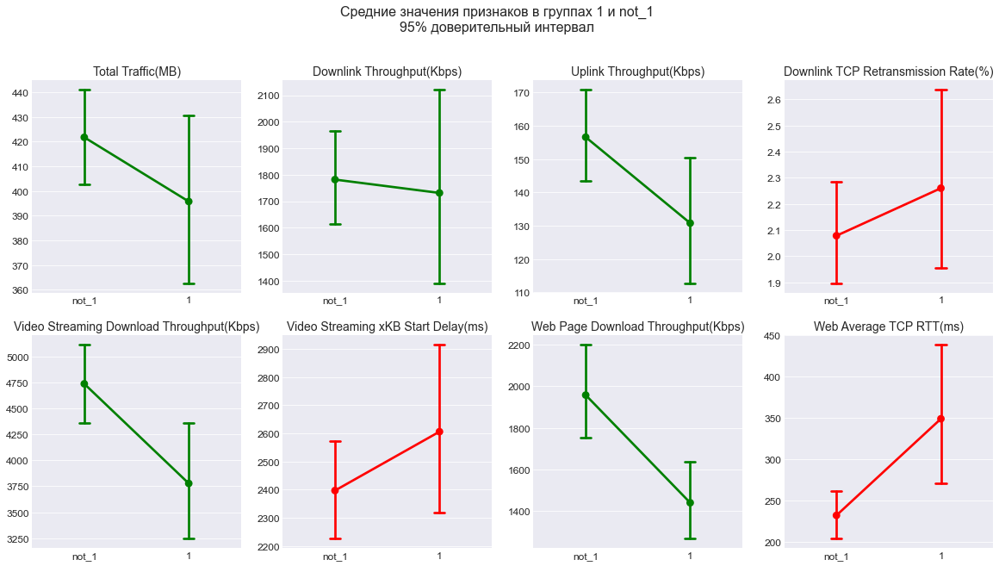

In [56]:
# Визуализация

fig, axs = plt.subplots(figsize=(20, 10), nrows=2, ncols=int(np.ceil(len(cols) / 2)))

for col, ax in zip(cols, axs.ravel()):
    
    names = df_4.groupby('Q1_fixed')['Q1_fixed'].count()
    a = df_4[df_4['Q1_fixed'] == names.index[0]][col].mean()
    b = df_4[df_4['Q1_fixed'] == names.index[1]][col].mean()
                
    sns.pointplot(data=df_4,
                  x='Q1_fixed',
                  y=col,
                  color='red' if a > b else 'green',
                  n_boot=1358,
                  ci=95,
                  seed=17,
                  capsize=.1,
                  ax=ax)
    
    ax.set_title(col, fontsize=14)
    
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    
    ax.xaxis.set_tick_params(labelsize=12)
    ax.yaxis.set_tick_params(labelsize=12)
     
plt.suptitle('Средние значения признаков в группах 1 и not_1\n95% доверительный интервал', fontsize=16, y=1.0)

canvas = FigureCanvasAgg(fig)
fig.canvas.draw()
renderer = fig._cachedRenderer
tightbox = fig.get_tightbbox(renderer)
w,h = fig.get_size_inches()
bbox = Bbox.from_extents(min(tightbox.x0, 0), min(tightbox.y0, 0), max(tightbox.x1, w), max(tightbox.y1, h))
plt.savefig('Means_with_conf.png', bbox_inches=bbox)

plt.show()

In [ ]:
# Визуализация не так убедительна, но все-таки опираемся именно на результат теста.

#### 4. Вывод

Мы хотели проверить наличие показателей, которые статистически отличаются для пользователей с самой низкой оценкой (1) среди всех остальных недовольных скоростью интернета (причина 4). Тест показал, что отличаются все показатели (в худшую сторону) кроме частоты отправки пакетов. В терминах постановки задачи нельзя выделить какие-то определенные показатели как наиболее важные для контроля и устранения возможных проблем.

То есть в среднем все технические показатели (кроме трафика) у недовольных скоростью интернета хуже чем у остальных. Но судя по объему трафика, в среднем интернетом пользуются все одинаково.

## Выводы

В результате проделанной работы в первую очередь были проанализированы собранные технические показатели. На основании полученных данных был сделан вывод об отсутствии корреляции между показателями, максимальный процент аномальных значений в одном показателе не превышает 9%. Были проанализированы ответы на вопросы и выявлены самые популярные причины недовольства. Было проверено три статистических гипотезы, основанных на данных. На основе результатов можно сделать следующие рекомендации:

- В будущем определенно следует проводить подобные опросы, так как различия в ответах пользователей подтверждаются различиями в значениях технических показателей - можно проводить работы по их улучшению;
- самые популярные причины неудовлетворенности - плохая связь в помещениях, недозвоны и медленный мобильный интернет (3, 1 и 4). Следует обратить внимание на эти моменты;
- В последующих опросах возможно имеет смысл убрать варианты 2 (долгое ожидание гудков) и 5 (медленная скорость загрузки видео), так как они скорее всего связаны с причинами 1 и 4 соответственно. Но лучше уточнить у технического отдела о подобной взаимосвязи;
- С точки зрения предотвращения (уменьшения) оттока пользователей нельзя выявить конкретные технические показатели, на которые следует обратить внимание в первую очередь. Можно посмотреть на это с двух сторон: нужно улучшать все показатели сразу, либо (если ресурсы ограничены) не важно какой показатель для улучшения выбрать в первую очередь.